In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
# from tqdm import tqdm
# import torchvision.datasets as datasets
# from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
# import torchvision.utils as vutils
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
# from torch.utils.data import Subset
# import numpy as np
from PIL import Image
import os

In [2]:
# images load => transform => dataset of all imgs
class ImageProcessor:
    def __init__(self, root_dir_path, transformations=None):
        self.root_dir_path = root_dir_path
        self.transformations = transformations

        # list of paths for all images
        self.all_img_paths = [os.path.join(root_dir_path, img) for img in os.listdir(root_dir_path)]

    def __len__(self):
        return len(self.all_img_paths)

    def __getitem__(self, idx):
        img_path = self.all_img_paths[idx]
        img = Image.open(img_path).convert("RGB")

        if self.transformations:
            img = self.transformations(img)

        return img

In [3]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(f"device is {device}")

LEARNING_RATE = 2e-4 
BATCH_SIZE = 128
IMAGE_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 100
NUM_EPOCHS = 5
FEATURES_DISC = 64
FEATURES_GEN = 64

device is cuda


In [4]:
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset_path = "./data./img_align_celeba/img_align_celeba" # add your path to celeba dataset here

dataset = ImageProcessor(dataset_path, transform)
dataloader = DataLoader(dataset=dataset, batch_size=BATCH_SIZE, shuffle=True)

In [5]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(z_dim, features_g * 16, 4, 1, 0),
            self._block(features_g * 16, features_g * 8, 4, 2, 1),
            self._block(features_g * 8, features_g * 4, 4, 2, 1),
            self._block(features_g * 4, features_g * 2, 4, 2, 1),
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),
            nn.Tanh()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.net(x)


In [6]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self._block(features_d, features_d * 2, 4, 2, 1),
            self._block(features_d * 2, features_d * 4, 4, 2, 1),
            self._block(features_d * 4, features_d * 8, 4, 2, 1),
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.disc(x)

In [7]:
def initialize_weights(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

In [8]:
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)

initialize_weights(gen)
initialize_weights(disc)

In [9]:
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

In [10]:
def show_tensor_images(image_tensor, num_images=32, size=(1, 64, 64)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Epoch [0/5] Batch 0/1583                   Loss D: 0.7216, loss G: 2.5837


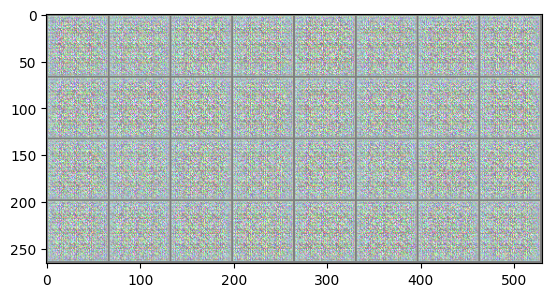

Epoch [0/5] Batch 50/1583                   Loss D: 0.1730, loss G: 14.9042


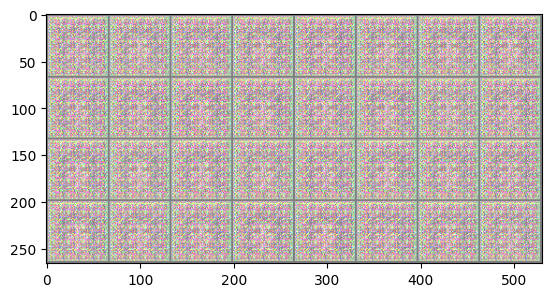

Epoch [0/5] Batch 100/1583                   Loss D: 0.8287, loss G: 1.8065


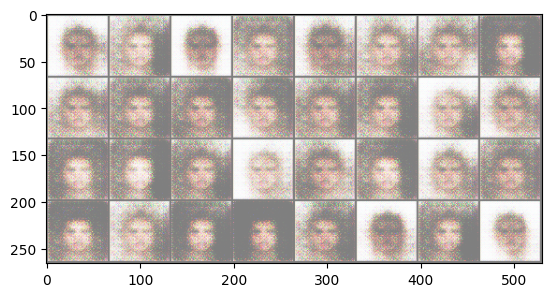

Epoch [0/5] Batch 150/1583                   Loss D: 0.3761, loss G: 2.0305


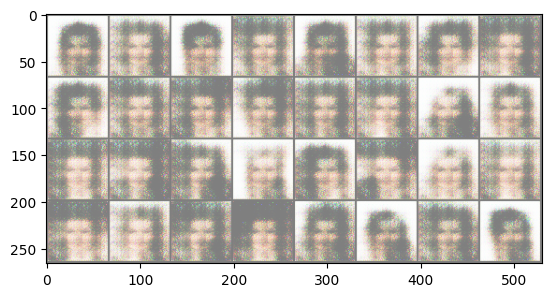

Epoch [0/5] Batch 200/1583                   Loss D: 0.3314, loss G: 2.5715


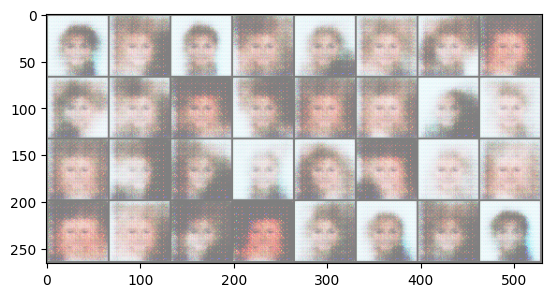

Epoch [0/5] Batch 250/1583                   Loss D: 0.7592, loss G: 3.0815


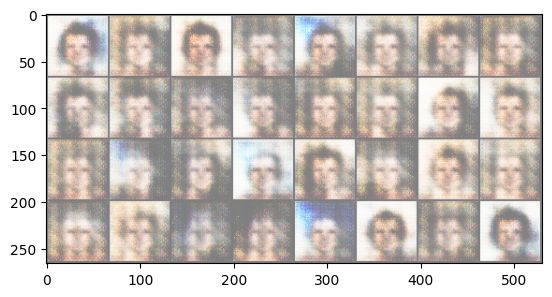

Epoch [0/5] Batch 300/1583                   Loss D: 0.4963, loss G: 1.8231


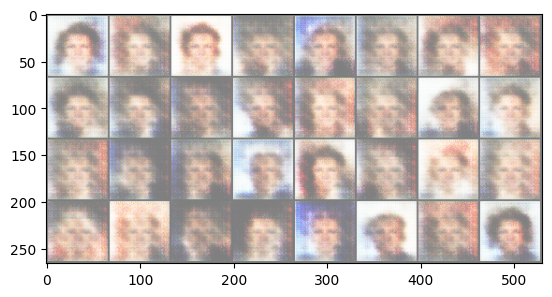

Epoch [0/5] Batch 350/1583                   Loss D: 0.3804, loss G: 1.8998


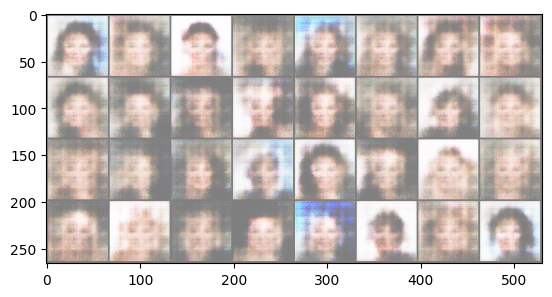

Epoch [0/5] Batch 400/1583                   Loss D: 0.7456, loss G: 2.8083


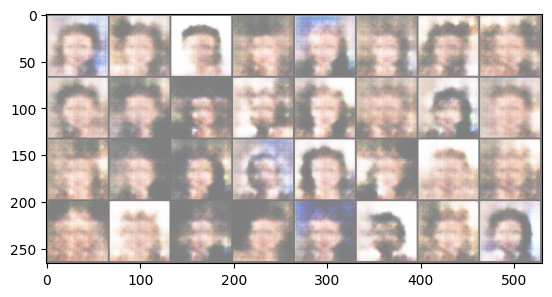

Epoch [0/5] Batch 450/1583                   Loss D: 0.4613, loss G: 2.7339


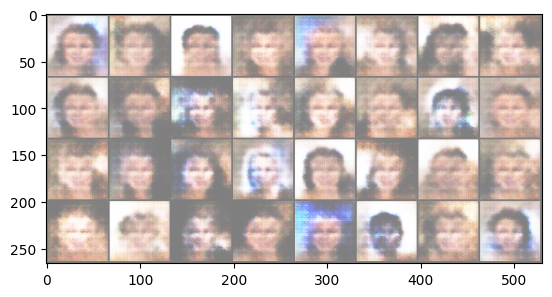

Epoch [0/5] Batch 500/1583                   Loss D: 0.5470, loss G: 2.8202


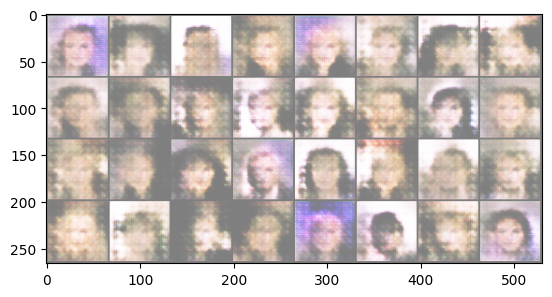

Epoch [0/5] Batch 550/1583                   Loss D: 0.2888, loss G: 3.5006


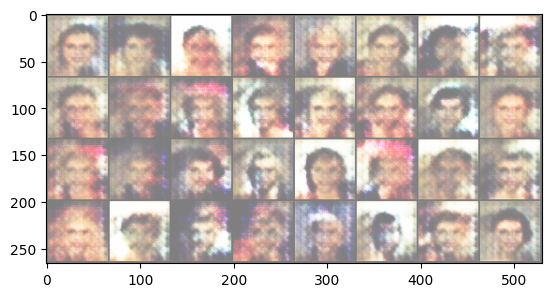

Epoch [0/5] Batch 600/1583                   Loss D: 0.5125, loss G: 3.1821


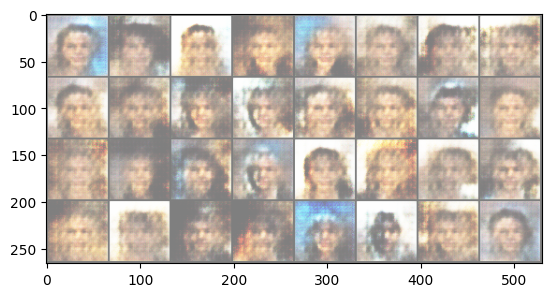

Epoch [0/5] Batch 650/1583                   Loss D: 0.4799, loss G: 2.5786


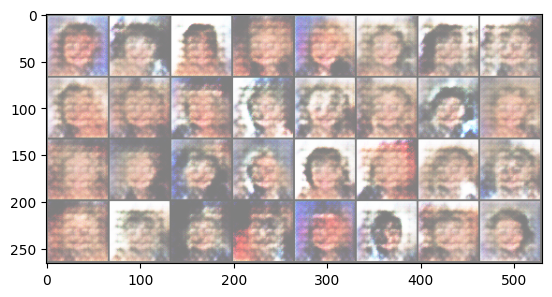

Epoch [0/5] Batch 700/1583                   Loss D: 0.3204, loss G: 2.9894


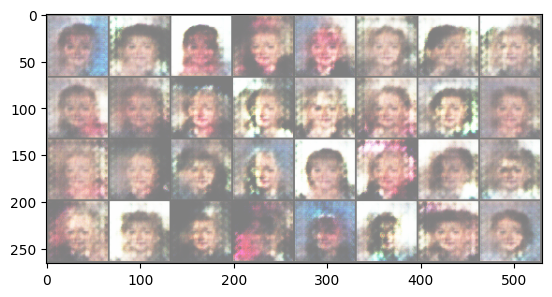

Epoch [0/5] Batch 750/1583                   Loss D: 0.4298, loss G: 2.6483


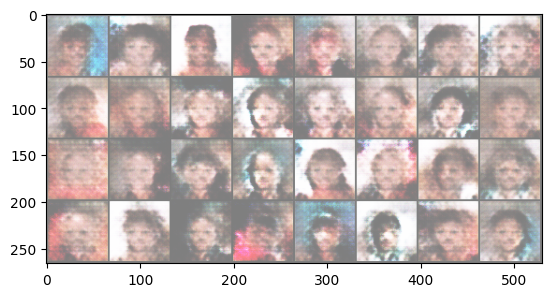

Epoch [0/5] Batch 800/1583                   Loss D: 0.4605, loss G: 2.2341


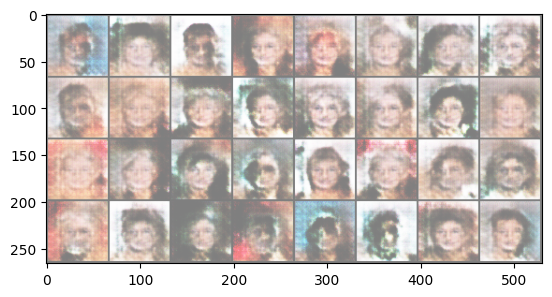

Epoch [0/5] Batch 850/1583                   Loss D: 0.5446, loss G: 2.7813


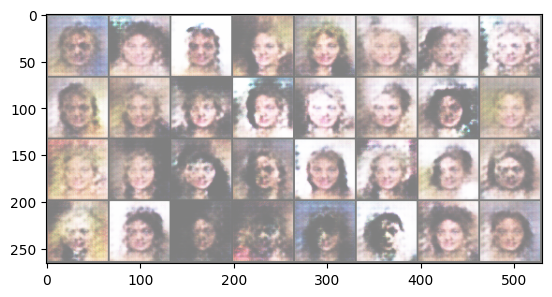

Epoch [0/5] Batch 900/1583                   Loss D: 0.4500, loss G: 2.9635


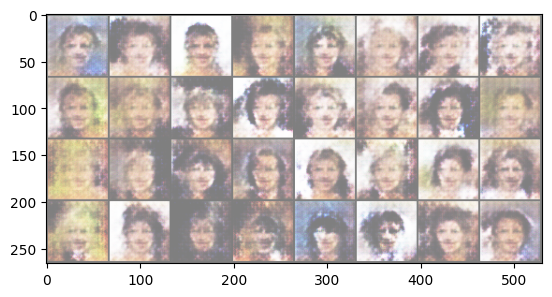

Epoch [0/5] Batch 950/1583                   Loss D: 0.3888, loss G: 2.1922


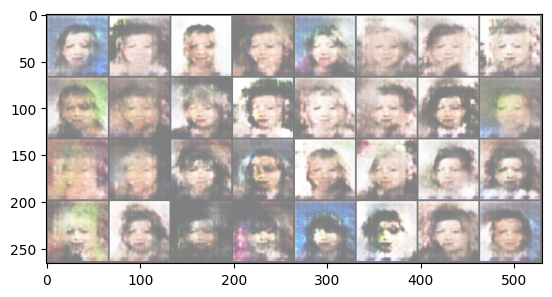

Epoch [0/5] Batch 1000/1583                   Loss D: 0.5747, loss G: 2.5875


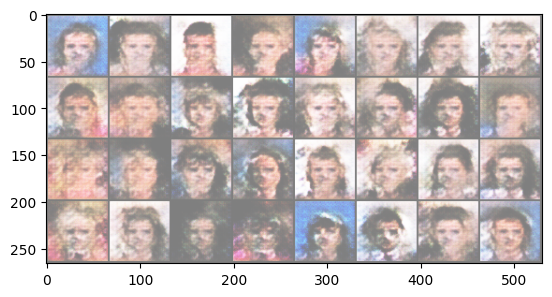

Epoch [0/5] Batch 1050/1583                   Loss D: 0.2409, loss G: 3.2570


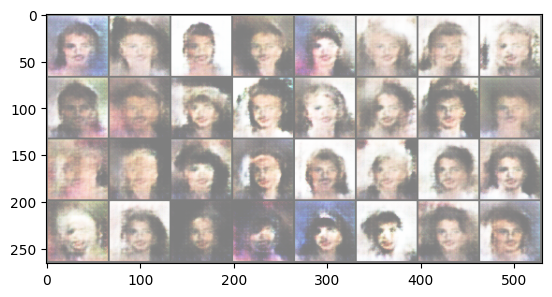

Epoch [0/5] Batch 1100/1583                   Loss D: 0.3642, loss G: 2.8810


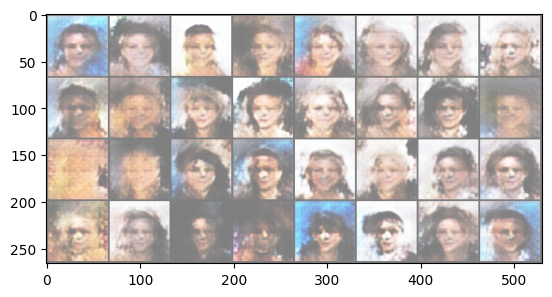

Epoch [0/5] Batch 1150/1583                   Loss D: 0.3101, loss G: 2.5536


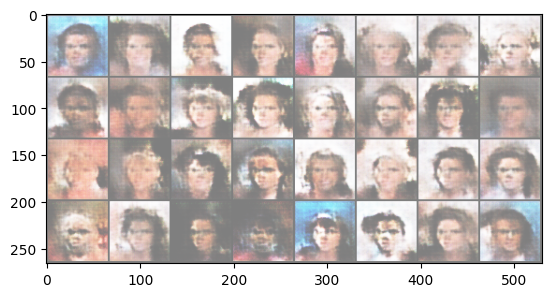

Epoch [0/5] Batch 1200/1583                   Loss D: 0.2516, loss G: 2.5118


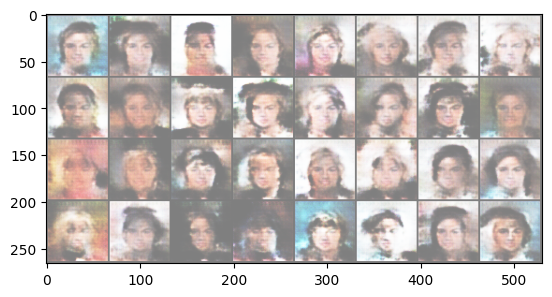

Epoch [0/5] Batch 1250/1583                   Loss D: 0.5868, loss G: 5.1154


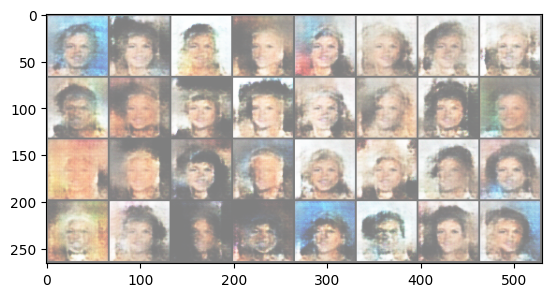

Epoch [0/5] Batch 1300/1583                   Loss D: 0.2834, loss G: 2.5344


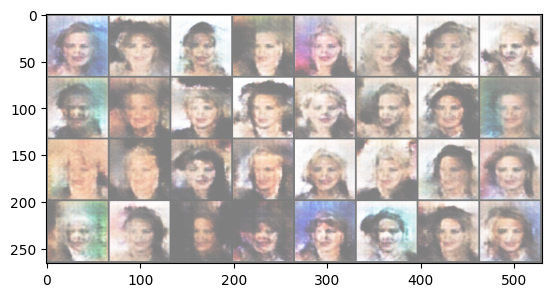

Epoch [0/5] Batch 1350/1583                   Loss D: 0.2680, loss G: 3.3130


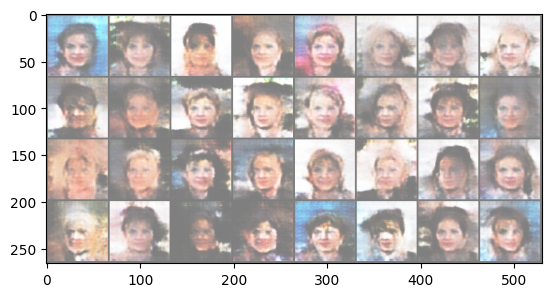

Epoch [0/5] Batch 1400/1583                   Loss D: 0.1575, loss G: 2.7187


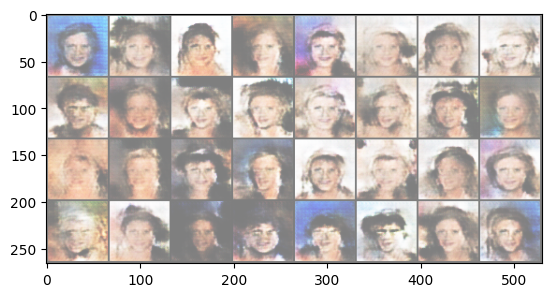

Epoch [0/5] Batch 1450/1583                   Loss D: 0.3723, loss G: 6.4525


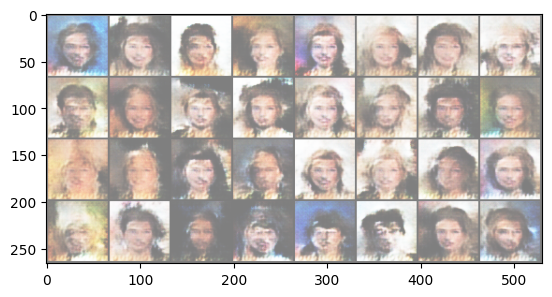

Epoch [0/5] Batch 1500/1583                   Loss D: 0.3571, loss G: 2.9615


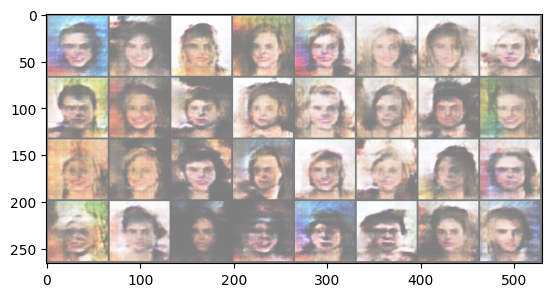

Epoch [0/5] Batch 1550/1583                   Loss D: 0.1480, loss G: 2.5444


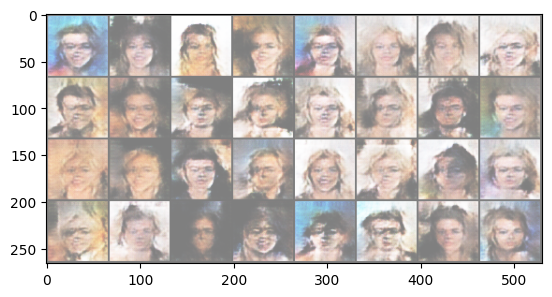

Epoch [1/5] Batch 0/1583                   Loss D: 0.2217, loss G: 2.7615


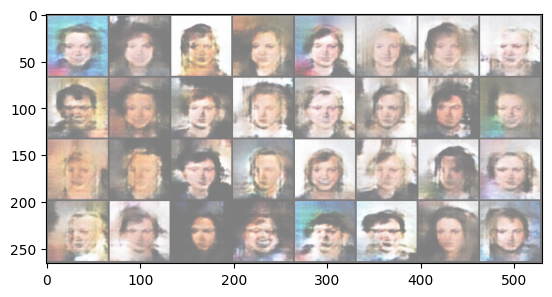

Epoch [1/5] Batch 50/1583                   Loss D: 0.2383, loss G: 2.2827


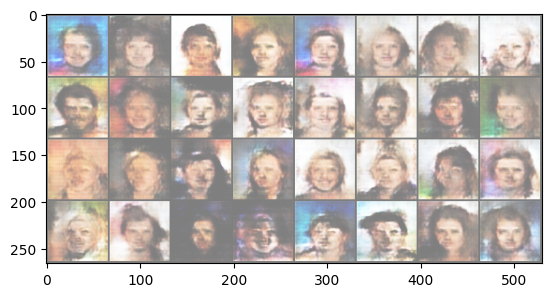

KeyboardInterrupt: 

In [11]:
gen.train()
disc.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, real in enumerate(dataloader):
        real = real.to(device)
        ### create noise tensor
        noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(device)
        fake = gen(noise)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).reshape(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).reshape(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        ### Print losses occasionally and fake images occasionally
        if batch_idx % 50 == 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )
            with torch.no_grad():
                fake = gen(fixed_noise)
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
                show_tensor_images(img_grid_fake)